In [1]:
# conda env create -f https://raw.githubusercontent.com/CSBDeep/CSBDeep/master/extras/environment-gpu-py3.8-tf2.4.yml
# conda env create -f r'C:\Users\Andre\PycharmProjects\monkey_nuc_segment\stardist\Fallopian tubes\environment-gpu-py3.8-tf2.4_AF.yml'

In [2]:
# conda install stardist

In [19]:
import numpy as np
import matplotlib.pyplot as plt

from tifffile import imread, imsave
from csbdeep.utils import Path, normalize
from csbdeep.utils.tf import keras_import
keras = keras_import()

from stardist import export_imagej_rois, random_label_cmap
from stardist.models import StarDist2D
from csbdeep.data import Normalizer, normalize_mi_ma

np.random.seed(0)
cmap = random_label_cmap()
import os
import  tensorflow as tf
from stardist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available
import copy
import json
from stardist.models import Config2D, StarDist2D, StarDistData2D


In [20]:
from stardist import export_imagej_rois, random_label_cmap
from stardist.models import StarDist2D

In [21]:
pth=r'\\10.99.68.178\andreex\data\Stardist'
pthtraining= os.path.join(pth,'Training')
pthtesting= os.path.join(pth,'Testing')
pthmodels= os.path.join(pth,'models')
pthfiles= os.path.join(pth,'files')
pthHE= os.path.join(pthtraining,'H&E_tiles')
pthmasks= os.path.join(pthtraining,'Mask_tiles')

In [22]:
if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available")
    
print(tf.__version__)

#Define the config by setting some parameter values
# 32 is a good default choice (see 1_data.ipynb)
n_rays = 32  #Number of radial directions for the star-convex polygon.

# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = True and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

n_channel = 3


conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = use_gpu,
    n_channel_in = n_channel,
)
# print(conf)
vars(conf)

def load_model(model_path: str) -> StarDist2D:
    # Load StarDist model weights, configurations, and thresholds
    with open(model_path + '\\config.json', 'r') as f:
        config = json.load(f)
    with open(model_path + '\\thresholds.json', 'r') as f:
        thresh = json.load(f)
    model = StarDist2D(config=Config2D(**config), basedir=model_path, name='offshoot_model')
    model.thresholds = thresh
    print('Overriding defaults:', model.thresholds, '\n')
    model.load_weights(model_path + '\\weights_best.h5')
    return model

GPU is available
2.10.1


In [23]:
# prints a list of available models
# StarDist2D.from_pretrained()

# creates a pretrained model
# model = StarDist2D.from_pretrained('2D_versatile_he')

outname='monkey_fallopian_tube_AF__11_03_2023_1e-4'
pth_model= os.path.join(pthmodels,outname)
model = load_model(pth_model)

Using default values: prob_thresh=0.5, nms_thresh=0.4.
Overriding defaults: Thresholds(prob=0.63499129199699, nms=0.3) 


In [24]:
def show_image(img, **kwargs):
    """Plot large image at different resolutions."""
    fig, ax = plt.subplots(2,4, figsize=(16,8))
    mid = [s//2 + 600 for s in img.shape[:2]]
    for a,t,u in zip(ax.ravel(),[1,2,4,8,16,32,64,128],[16,8,4,2,1,1,1,1]):
        sl = tuple(slice(c - s//t//2, c + s//t//2, u) for s,c in zip(img.shape[:2],mid))
        a.imshow(img[sl], **kwargs)
        a.axis('off')
    plt.tight_layout()
    plt.show()

In [25]:
np.random.seed(0)
cmap = random_label_cmap()

In [26]:
# pth = r'\\10.99.68.178\andreex\data\monkey fetus\gestational 40\1024tiles'  # path of ndpi files
pth = r'\\169.254.138.20\Andre\data\Ashleigh fallopian tube\fallopian tubes\AJER376'  # path of ndpi files

# WSIs = [_ for _ in os.listdir(pth) if _.endswith('tif')]
WSIs = [_ for _ in os.listdir(pth) if _.endswith('ndpi')]


In [27]:
print(WSIs[1])

fallopian_tubes_AJER376_003.ndpi


In [28]:
img = imread(os.path.join(pth,WSIs[0]))

In [29]:
img.shape

(38016, 61440, 3)

In [30]:
class MyNormalizer2(Normalizer):
    def __init__(self, mi, ma):
            self.mi, self.ma = mi, ma
    def before(self, x, axes):
        return normalize_mi_ma(x, self.mi, self.ma, dtype=np.float32)
    def after(*args, **kwargs):
        assert False
    @property
    def do_after(self):
        return False

mi, ma = np.percentile(img[::8], [2,98])                      # compute percentiles from low-resolution image
# mi, ma = np.percentile(img[13000:16000,13000:16000], [1,99.8])  # compute percentiles from smaller crop
normalizer2 = MyNormalizer2(mi, ma)

In [31]:
def show_image(img, crop_x, crop_y, tile_size, **kwargs):
    """Plot large image at different resolutions."""
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))

    # Plot the original image on the left
    ax[0].imshow(img, **kwargs)

    # Crop the image
    cropped_img = img[crop_y:crop_y+tile_size, crop_x:crop_x+tile_size]

    # Plot the cropped image on the right
    ax[1].imshow(cropped_img, **kwargs)

    ax[0].axis('off')
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()

In [12]:
crop_x=27000
crop_y=21000
tilesz=2000*2

print(f'x: {crop_x},\ny: {crop_y},\ntile_size: {tilesz}')

x: 27000,
y: 21000,
tile_size: 4000


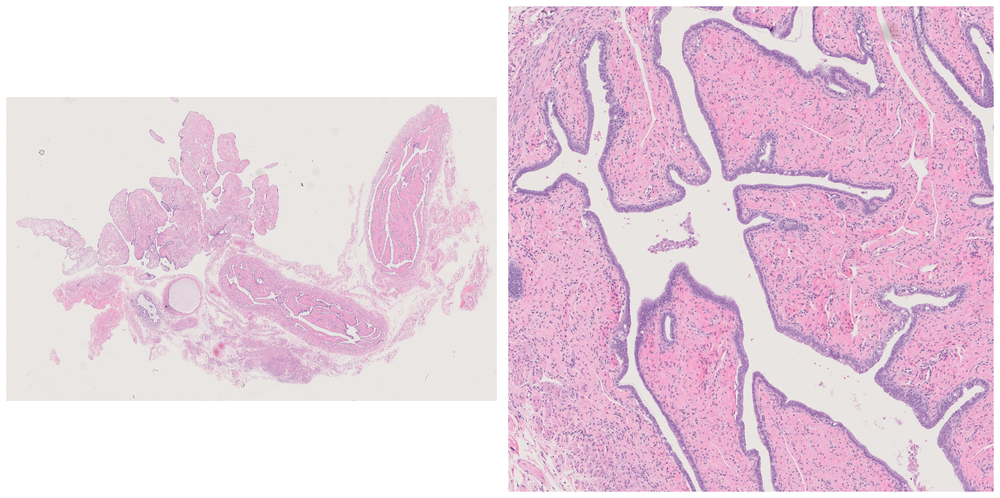

In [13]:
show_image(img,crop_x,crop_y, tilesz)

In [14]:
labels, polys = model.predict_instances_big(img, axes='YXC', block_size=4096, min_overlap=128, context=128,
                                            normalizer=normalizer2, n_tiles=(4,4,1))

effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|██████████| 187/187 [07:44<00:00,  2.48s/it]


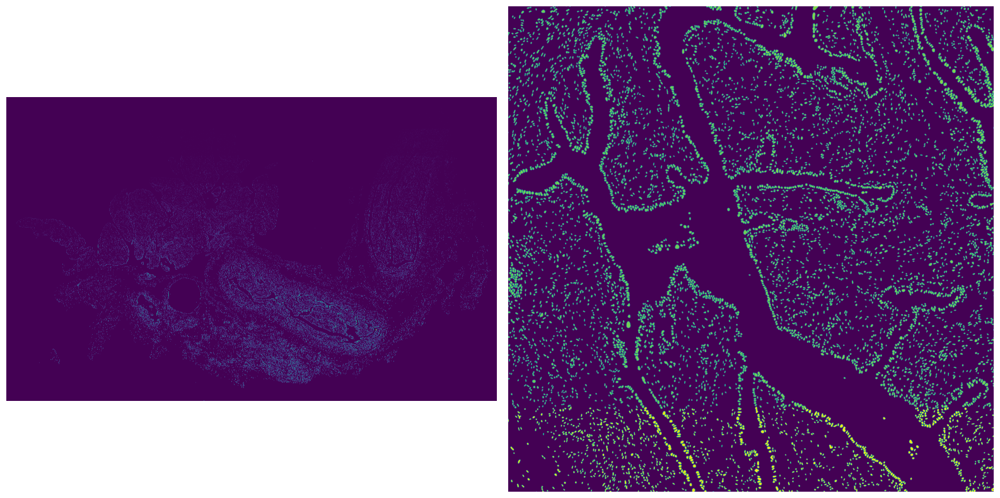

In [15]:
show_image(labels, crop_x,crop_y, tilesz)

In [16]:
 cropped_img = img[crop_y:crop_y+tilesz, crop_x:crop_x+tilesz]
 cropped_labels = labels[crop_y:crop_y+tilesz, crop_x:crop_x+tilesz]

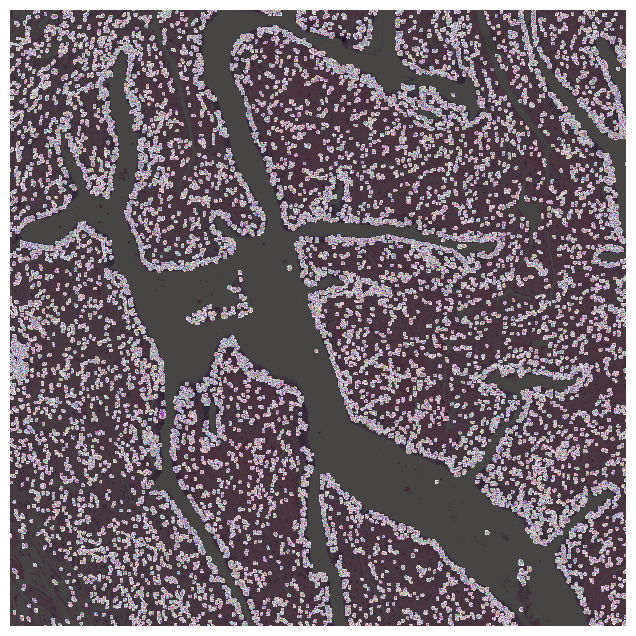

In [17]:
plt.figure(figsize=(8,8))
plt.imshow(cropped_img)
plt.imshow(cropped_labels, cmap=cmap, alpha=0.7)
plt.axis('off');

In [24]:
 tilesz2=1024
 cropped_img2 = img[crop_y:crop_y+tilesz2, crop_x:crop_x+tilesz2]
 cropped_labels2 = labels[crop_y:crop_y+tilesz2, crop_x:crop_x+tilesz2]

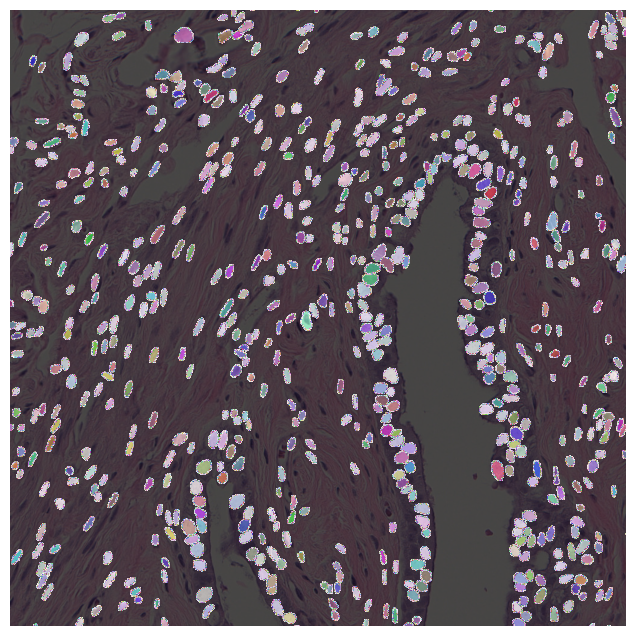

In [25]:
plt.figure(figsize=(8,8))
plt.imshow(cropped_img2)
plt.imshow(cropped_labels2, cmap=cmap, alpha=0.7)
plt.axis('off');

In [31]:
# img = imread(os.path.join(pth,WSIs[0]))

n_channel = 1 if img[0].ndim == 2 else img[0].shape[-1]  #If no third
# axis_norm = (0,1)   # normalize channels independently
axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))
    sys.stdout.flush()
imgnorm = normalize(img,1,99.8,axis=axis_norm)

In [32]:
labelsnorm, polysnorm = model.predict_instances_big(imgnorm, axes='YXC', block_size=4096, min_overlap=128, context=128, n_tiles=(4,4,1))

effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|██████████| 187/187 [06:57<00:00,  2.23s/it]


In [33]:
tilesz2=1024
cropped_img2norm = imgnorm[crop_y:crop_y+tilesz2, crop_x:crop_x+tilesz2]
cropped_labels2norm = labelsnorm[crop_y:crop_y+tilesz2, crop_x:crop_x+tilesz2]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


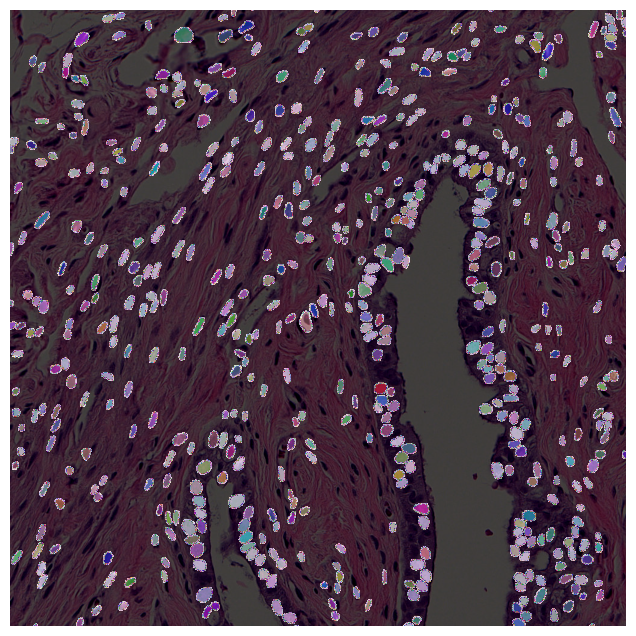

In [34]:
plt.figure(figsize=(8,8))
plt.imshow(cropped_img2norm)
plt.imshow(cropped_labels2norm, cmap=cmap, alpha=0.7)
plt.axis('off');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


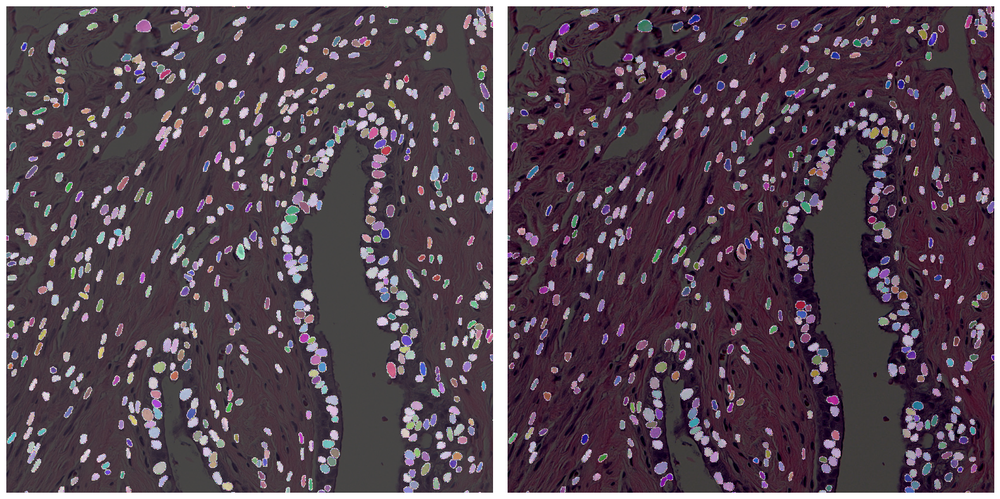

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
ax[0].imshow(cropped_img2)
ax[0].imshow(cropped_labels2, cmap=cmap, alpha=0.7)
ax[1].imshow(cropped_img2norm)
ax[1].imshow(cropped_labels2norm, cmap=cmap, alpha=0.7)
ax[0].axis('off')
ax[1].axis('off')
plt.tight_layout()
plt.show()